# Agrupando colores

Vamos a crear imagenes con una cantidad fija de colores

#### 1. Importa las librerias
Vamos a necesitar `KMeans` de `sklearn.cluster`, `imread` de `matplotlib.image`, `matplotlib.pyplot` y `numpy`


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


#### 2. Lee una imagen
Utiliza alguna foto que tengas en tu ordenador y leela con la función `imread`

Consejo: utiliza una imagen pequeña si no quieres tardar una eternidad en que se ejecute el kmeans

In [3]:
image = plt.imread('data/foto_clase.PNG')
image

array([[[1.        , 1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        ],
        ...,
        [0.8117647 , 0.93333334, 0.99607843, 1.        ],
        [0.65882355, 0.78039217, 0.98039216, 1.        ],
        [0.65882355, 0.78039217, 0.98039216, 1.        ]],

       [[1.        , 1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        ],
        ...,
        [0.8862745 , 0.99607843, 1.        , 1.        ],
        [0.7882353 , 0.90588236, 0.99215686, 1.        ],
        [0.65882355, 0.78039217, 0.98039216, 1.        ]],

       [[1.        , 1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        , 1.        ],
        ...,
        [0.89411765, 1.        , 1.        , 1.        ],
        [0.8862745 , 0.992156

In [5]:
image.shape

(755, 1356, 4)

In [6]:
image = image[:,:,:3].copy()
image.shape

(755, 1356, 3)

In [7]:
image.shape[0] * image.shape[1]

1023780

Muestra la imagen para ver que se ha cargado bien

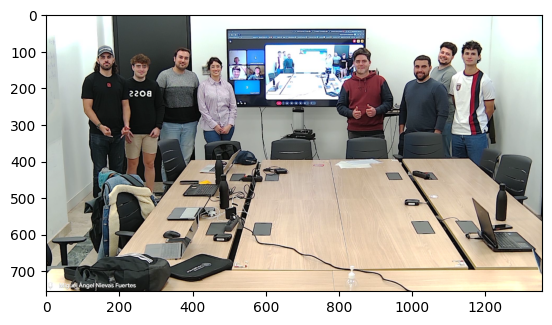

In [8]:
plt.imshow(image)

#### 3. Modifica la estructura de la imagen
Queremos que cada pixel sea una observación por lo que tenemos que transformar nuestra imagen de un vector de forma (alto, ancho, color) a (alto x ancho, color). Color será siempre 3, que son los tres canales de los colores.

Ej: (300, 400, 3) -> (120000, 3)

In [9]:
X = image.reshape(-1,3)
X.shape

(1023780, 3)

#### 4. K-means
Haz un k-means con la imagen de entrada (Con la nueva forma que le hemos dado). K será el número de colores que quieras que tenga tu imagen de salida

In [10]:
k = 5

kmeans = KMeans(n_clusters=k, n_init='auto', random_state=10).fit(X)

#### 5. Sustituye cada valor por su centroide

Una vez hemos entrenado el kmeans entre otros parametros de salida tiene `cluster_centers_` y `labels_`. Utilizlos para crear una nueva imagen (recuerda que las imagenes simplemente son vectores numéricos) en la que cada pixel se sustituye por su centroide correspondiente.

In [11]:
kmeans.labels_

array([2, 2, 2, ..., 2, 1, 1])

In [12]:
df_cluster = pd.DataFrame(X, columns=["R","G","B"])
df_cluster['cluster'] = kmeans.labels_
df_cluster

,R,G,B,cluster
0,1.000000,1.000000,1.000000,2
1,1.000000,1.000000,1.000000,2
2,1.000000,1.000000,1.000000,2
3,1.000000,1.000000,1.000000,2
4,1.000000,1.000000,1.000000,2
...,...,...,...,...
1023775,1.000000,0.909804,0.764706,1
1023776,1.000000,0.913725,0.776471,2
1023777,0.894118,0.874510,0.850980,2
1023778,0.658824,0.780392,0.980392,1


In [14]:
import plotly.express as px

fig = px.scatter_3d(df_cluster.sample(frac=0.01), x="R", y="G", z="B", color="cluster")
fig.show()

In [15]:
kmeans.cluster_centers_

array([[0.09687257, 0.09659389, 0.10452932],
       [0.8522657 , 0.7927559 , 0.7140988 ],
       [0.95984656, 0.9769486 , 0.95401263],
       [0.59161234, 0.5978554 , 0.5844978 ],
       [0.2921065 , 0.28526416, 0.29859418]], dtype=float32)

In [16]:
segmented_img = kmeans.cluster_centers_[kmeans.labels_]
segmented_img

array([[0.95984656, 0.9769486 , 0.95401263],
       [0.95984656, 0.9769486 , 0.95401263],
       [0.95984656, 0.9769486 , 0.95401263],
       ...,
       [0.95984656, 0.9769486 , 0.95401263],
       [0.8522657 , 0.7927559 , 0.7140988 ],
       [0.8522657 , 0.7927559 , 0.7140988 ]], dtype=float32)

#### 6. Modifica la estructura de la imagen
Para trabajar con el k-means requeriamos que la imagen original fuese un solo vector, ahora como queremos volver a tener la imagen para volver mostrarla debemos hacer el proceso inverso a el paso 3. (Si has guardado la forma de la imagen original te será más facil hacer este paso)

In [17]:
segmented_img = segmented_img.reshape(image.shape)
segmented_img.shape

(755, 1356, 3)

#### 7. Imprime y guarda en tu ordenador la imagen resultante

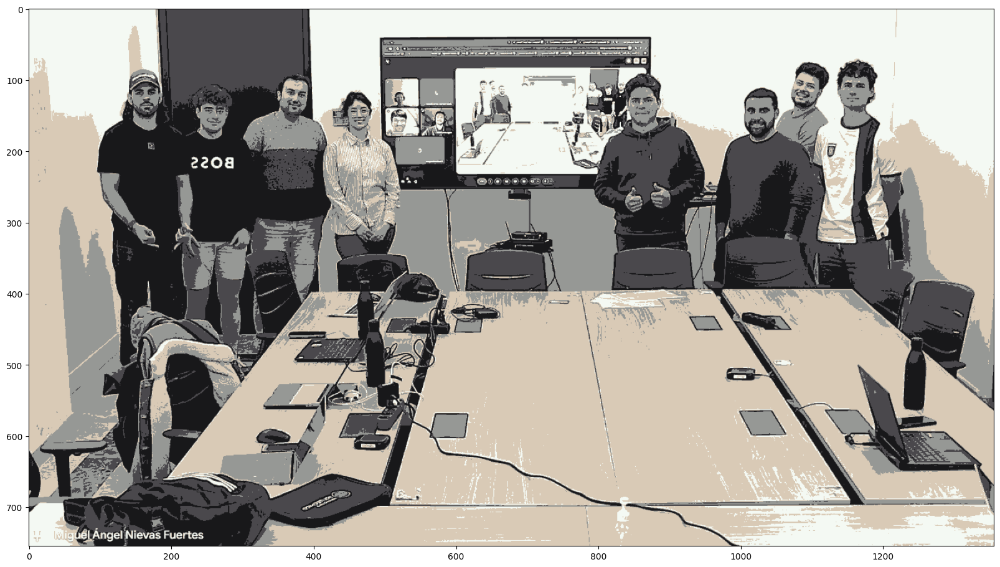

In [19]:
plt.figure(figsize=(20,15))
plt.imshow(segmented_img)

#### 8. Crea una función
Crea una función que tenga como argumentos de entrada una imagen, el numero de colores que quieres que tenga, y si se quiere guardar o mostrar por pantalla

In [22]:
def cluster_colors(image, n_colores):
    image = plt.imread(image)
    image = image[:,:,:3].copy()
    X = image.reshape(-1,3)
    kmeans = KMeans(n_clusters=n_colores, n_init='auto').fit(X)
    segmented_img = kmeans.cluster_centers_[kmeans.labels_]
    df_cluster = pd.DataFrame(X, columns=["R","G","B"])
    df_cluster['cluster'] = kmeans.labels_
    fig = px.scatter_3d(df_cluster.sample(frac=0.01), x="R", y="G", z="B", color="cluster")
    fig.show()  
    plt.figure(figsize=(20,15))
    plt.imshow(segmented_img.reshape(image.shape))

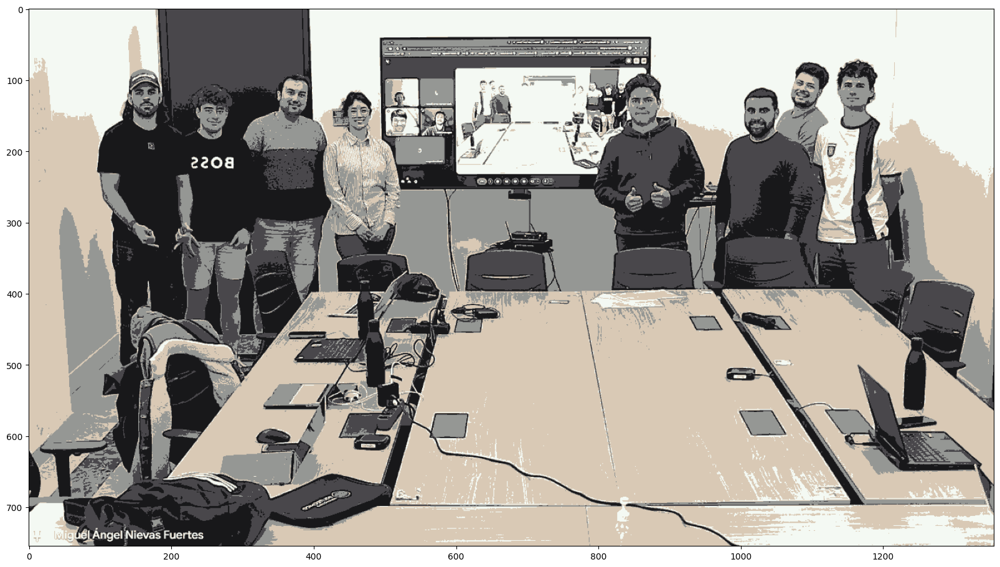

In [23]:
cluster_colors("data/foto_clase.PNG", 5)

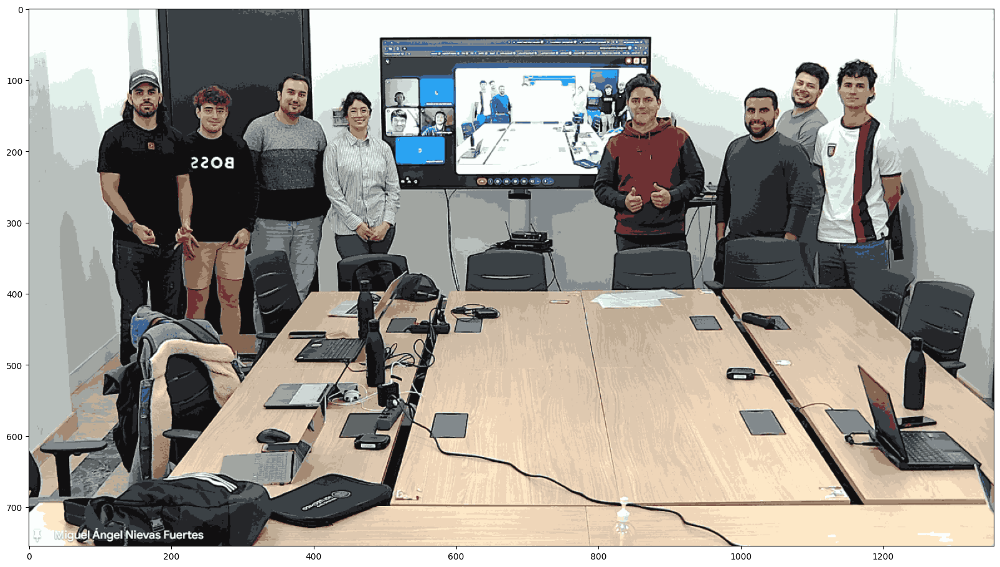

In [24]:
cluster_colors("data/foto_clase.PNG", 20)

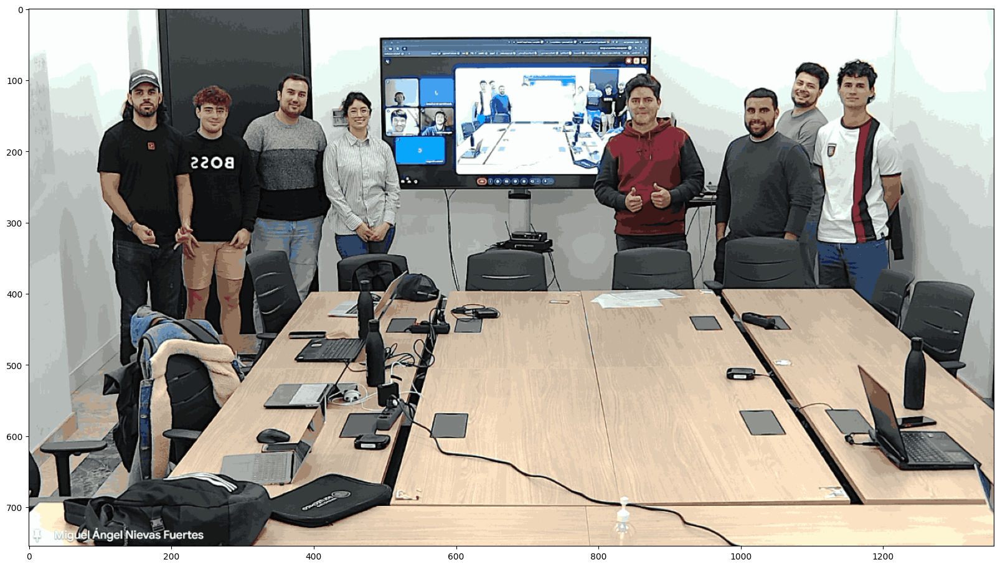

In [25]:
cluster_colors("data/foto_clase.PNG", 40)

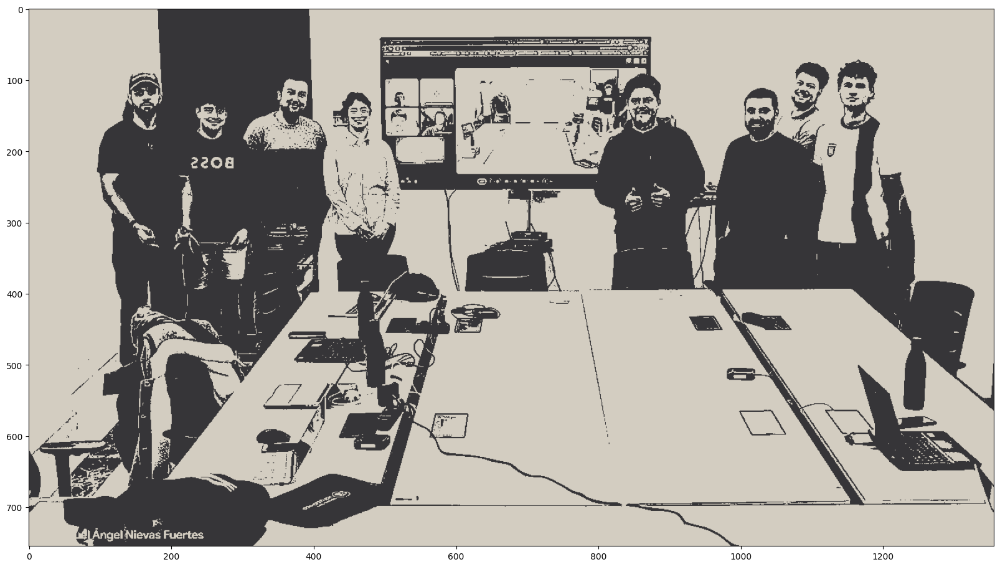

In [26]:
cluster_colors("data/foto_clase.PNG", 2)

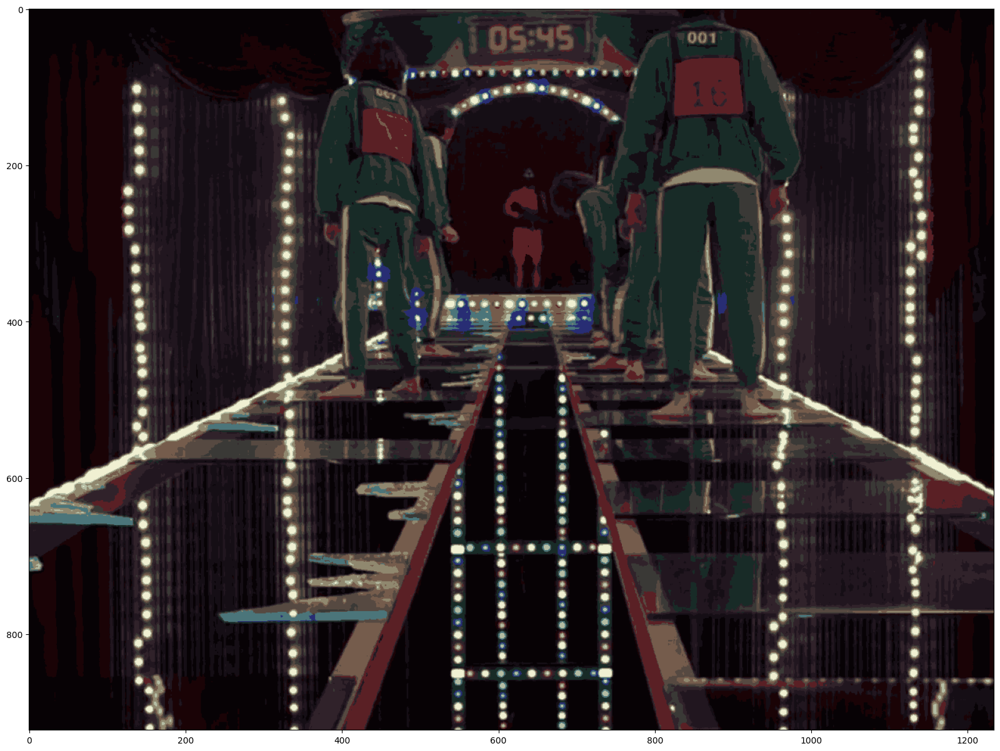

In [28]:
cluster_colors("data/calamar.PNG", 15)